In [1]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', 1000)

In [2]:
data = pd.read_csv("immo_lyon17_22_last.csv")

In [ ]:
data.drop("Unnamed: 0", axis=1, inplace=True)

data.head()

In [7]:
data = data.sort_values('year',ascending=True)
data.head()

,index,valeur_fonciere,adresse_numero,adresse_nom_voie,nom_commune,id_parcelle,type_local,surface_reelle_bati,nombre_pieces_principales,longitude,latitude,year,month,trim,index_prix
39360,374346,212300.0,81.0,RUE PARMENTIER,Lyon 7e Arrondissement,69387000BD0051,Appartement,59.0,2.0,4.844981,45.745177,2017,8,2017-T3,4.5
38446,375061,465000.0,9.0,RUE BATAILLE,Lyon 8e Arrondissement,69388000AR0240,Appartement,126.0,6.0,4.868191,45.738802,2017,8,2017-T3,4.5
48981,378884,80000.0,152.0,RTE DE VIENNE,Lyon 8e Arrondissement,69388000CE0087,Appartement,41.0,1.0,4.853008,45.734812,2017,12,2017-T4,4.3
49351,380412,95000.0,70.0,RUE DU PENSIONNAT,Lyon 3e Arrondissement,69383000AX0016,Appartement,53.0,3.0,4.855892,45.754805,2017,12,2017-T4,4.3
34380,379728,326850.0,58.0,CRS RICHARD VITTON,Lyon 3e Arrondissement,69383000CO0096,Appartement,80.0,1.0,4.891338,45.753208,2017,12,2017-T4,4.3


In [8]:
mask_app = (data["type_local"] == 'Appartement')
data_app = data.loc[mask_app, :]
mask_home = (data["type_local"] == 'Maison')
data_home = data.loc[mask_home, :]

<AxesSubplot: xlabel='nom_commune', ylabel='valeur_fonciere'>

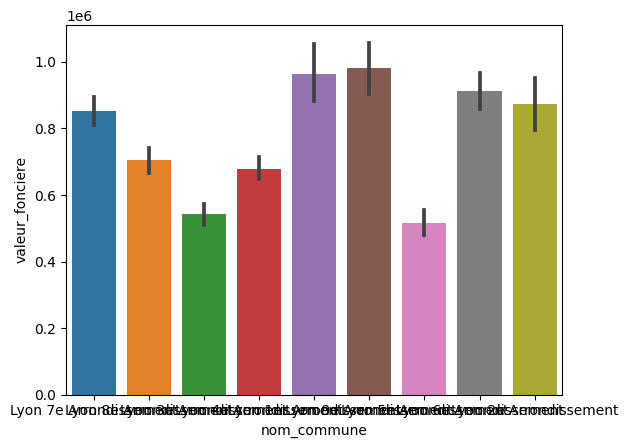

In [9]:
sns.barplot(data, x='nom_commune',y='valeur_fonciere')

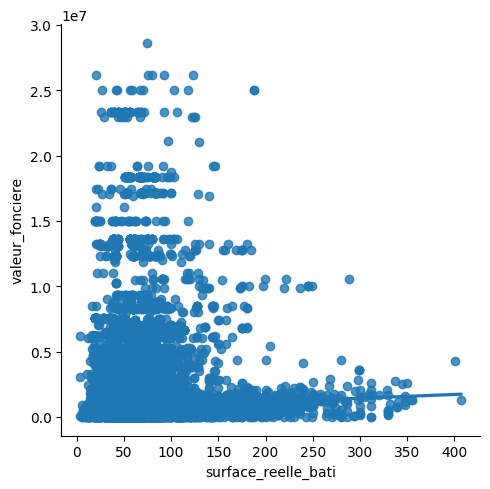

In [10]:
sns.lmplot(x = "surface_reelle_bati", y="valeur_fonciere", data = data)

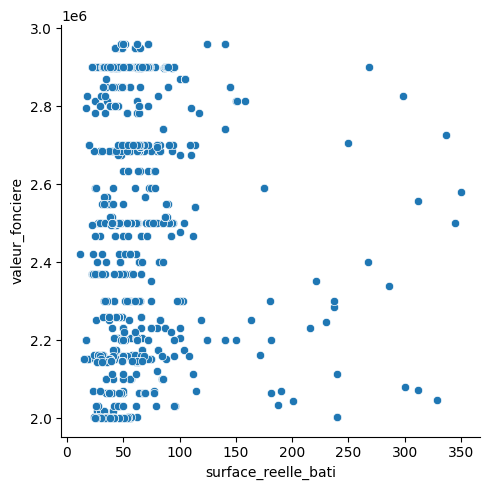

In [11]:
mask1 = (data["valeur_fonciere"] < 1000000)
datav1 = data.loc[mask1, :]
mask2 = ((data["valeur_fonciere"] >= 1000000) & (data["valeur_fonciere"] < 2000000))
datav2 = data.loc[mask2,:]
mask3 = ((data["valeur_fonciere"] >= 2000000) & (data["valeur_fonciere"] < 3000000))
datav3 = data.loc[mask3,:]
mask4= ((data["valeur_fonciere"] >= 3000000) )
datav4= data.loc[mask4,:]
mask1_5 = (data["valeur_fonciere"] < 1500000)
datav1_5 = data.loc[mask1_5, :]
mask1_6 = (data["valeur_fonciere"] >= 1500000)
datav1_6 = data.loc[mask1_6, :]
sns.relplot(data=datav3, x= "surface_reelle_bati", y= "valeur_fonciere")


In [12]:
t1 = len(datav1)+len(datav2)+len(datav3)+len(datav4)
t2 = len(datav1_5)+len(datav1_6)

In [13]:
print("moins de 1M€", len(datav1))
print("entre 1M€ et 2M€", len(datav2))
print("entre 2M€ et 3M€", len(datav3))
print("plus de 3M€", len(datav4))
print("total", t1)
print("moins de 1,5M€", len(datav1_5))
print("plus de 1,5M€", len(datav1_6))
print("total", t2)


moins de 1M€ 45419
entre 1M€ et 2M€ 2034
entre 2M€ et 3M€ 908
plus de 3M€ 2764
total 51125
moins de 1,5M€ 46666
plus de 1,5M€ 4459
total 51125


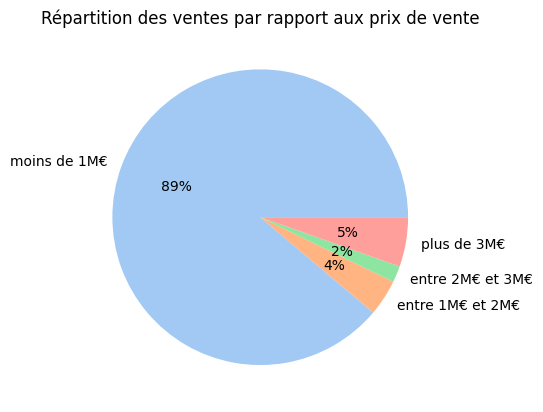

In [14]:
#define data
data_viz = [len(datav1), len(datav2), len(datav3), len(datav4)]
labels = ['moins de 1M€', 'entre 1M€ et 2M€', 'entre 2M€ et 3M€', 'plus de 3M€']

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart
plt.pie(data_viz, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Répartition des ventes par rapport aux prix de vente')
plt.show()

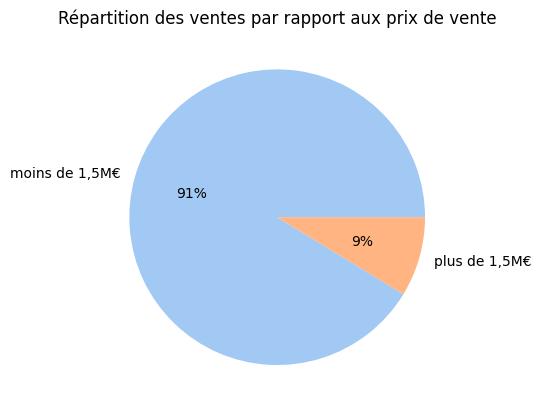

In [42]:
#define data
data_viz1 = [len(datav1_5), len(datav1_6)]
labels = ['moins de 1,5M€', 'plus de 1,5M€']

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

#create pie chart
plt.pie(data_viz1, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Répartition des ventes par rapport aux prix de vente')
plt.show()

In [43]:
# Visualize pairwise dependencies
fig = px.scatter_matrix(data)
fig.update_layout(
        title = go.layout.Title(text = "Bivariate analysis", x = 0.5), showlegend = False, 
            autosize=False, height=1600, width = 1600)
fig.show()

c:\Users\dunca\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



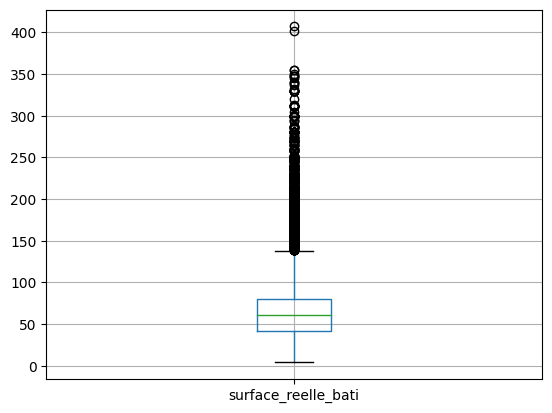

In [44]:
boxplot = data.boxplot(column=['surface_reelle_bati'])

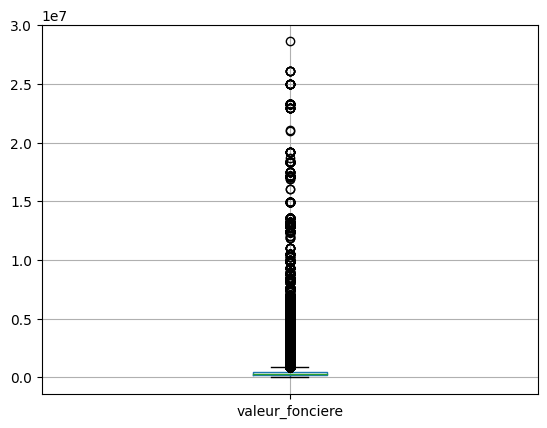

In [45]:
boxplot = data.boxplot(column=['valeur_fonciere'])

In [46]:
corr = data.corr()
display(corr)

C:\Users\dunca\AppData\Local\Temp\ipykernel_13508\2795641452.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,index,valeur_fonciere,adresse_numero,surface_reelle_bati,nombre_pieces_principales,longitude,latitude,year,month,index_prix
index,1.000000,-0.041310,-0.015612,0.002688,0.004527,0.017619,-0.028658,0.380321,0.045719,0.368204
valeur_fonciere,-0.041310,1.000000,-0.021220,0.050232,0.035501,-0.025045,0.022349,-0.037701,0.073532,-0.005254
adresse_numero,-0.015612,-0.021220,1.000000,0.000826,0.018856,-0.007741,-0.037613,-0.006356,-0.000995,-0.017856
surface_reelle_bati,0.002688,0.050232,0.000826,1.000000,0.856268,-0.066430,0.103135,0.026973,-0.030014,0.017115
nombre_pieces_principales,0.004527,0.035501,0.018856,0.856268,1.000000,-0.082796,0.042481,0.021586,-0.024992,0.013294
longitude,0.017619,-0.025045,-0.007741,-0.066430,-0.082796,1.000000,-0.444246,-0.017545,-0.003698,-0.005825
latitude,-0.028658,0.022349,-0.037613,0.103135,0.042481,-0.444246,1.000000,0.045448,-0.034447,0.018049
year,0.380321,-0.037701,-0.006356,0.026973,0.021586,-0.017545,0.045448,1.000000,-0.300543,0.512187
month,0.045719,0.073532,-0.000995,-0.030014,-0.024992,-0.003698,-0.034447,-0.300543,1.000000,-0.007285
index_prix,0.368204,-0.005254,-0.017856,0.017115,0.013294,-0.005825,0.018049,0.512187,-0.007285,1.000000


<AxesSubplot: >

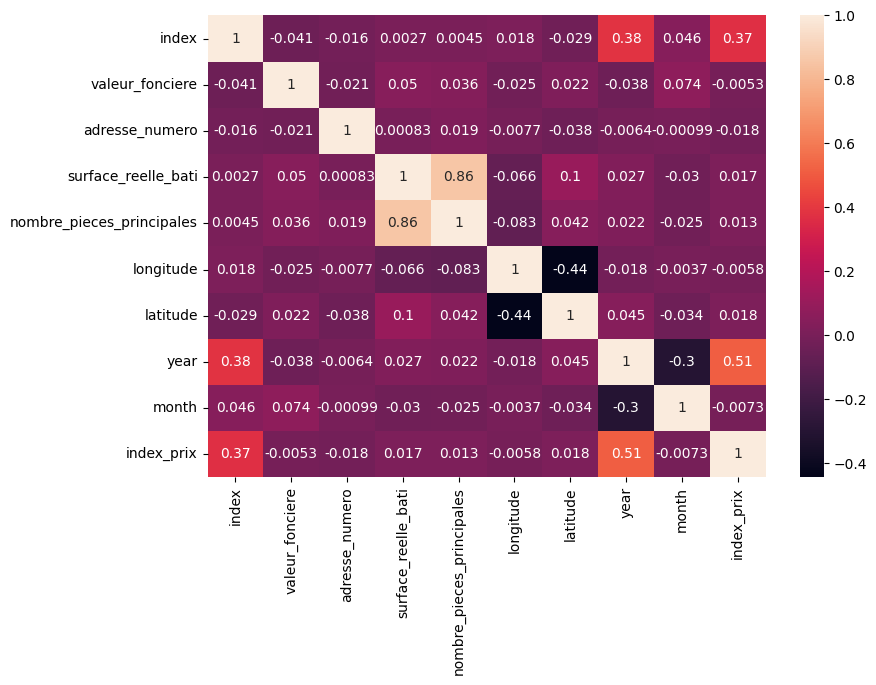

In [47]:
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(corr, annot=True, ax=ax)

In [48]:
corr["valeur_fonciere"].sort_values( ascending = False) 

valeur_fonciere              1.000000
month                        0.073532
surface_reelle_bati          0.050232
nombre_pieces_principales    0.035501
latitude                     0.022349
index_prix                  -0.005254
adresse_numero              -0.021220
longitude                   -0.025045
year                        -0.037701
index                       -0.041310
Name: valeur_fonciere, dtype: float64

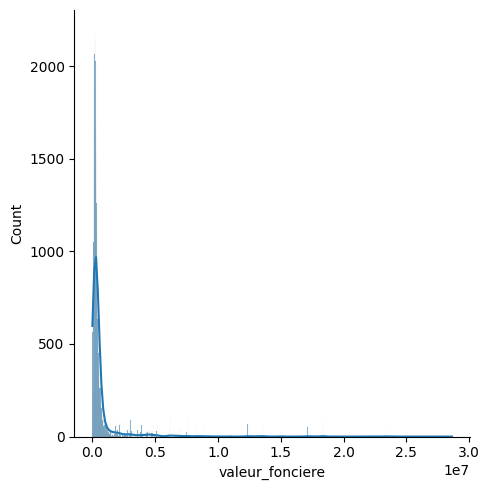

In [49]:
sns.displot(data["valeur_fonciere"], kde=True)

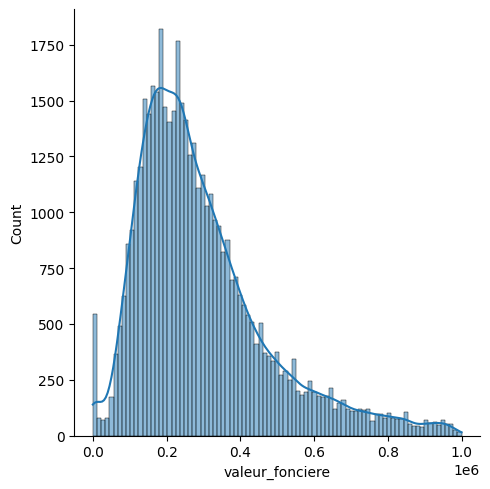

In [50]:
#répartition moins de 1M€
sns.displot(datav1["valeur_fonciere"], kde=True)

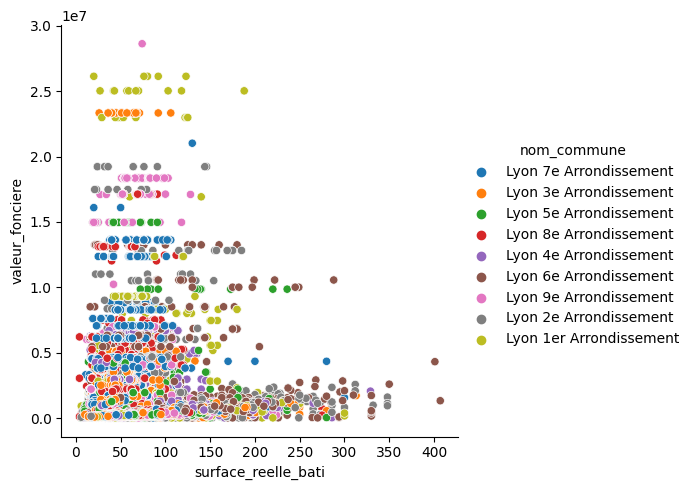

In [55]:
#appartement
sns.relplot(x = 'surface_reelle_bati' , y ='valeur_fonciere' , data = data_app, hue = 'nom_commune')

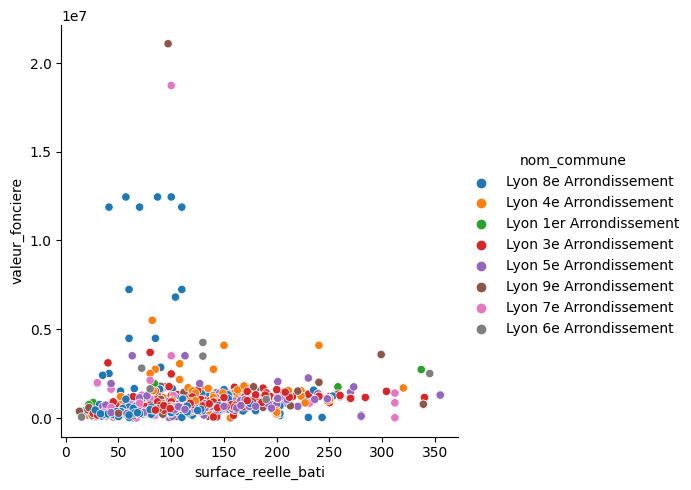

In [56]:
#maison
sns.relplot(x = 'surface_reelle_bati' , y ='valeur_fonciere' , data = data_home, hue = 'nom_commune')

In [15]:


fig = px.scatter_mapbox(data, lat="latitude", lon="longitude",color='nom_commune',animation_frame="year", zoom=11, title= 'répartition des vente par année et par arrondissement')
fig.update_layout(mapbox_style="open-street-map")
fig.update_traces(cluster=dict(enabled=True))
fig.update_layout(margin={"r": 0, "t": 0, "b": 0})
fig.show()